# Overview: In this notebook we outline sample level QC after reanalzying the IHC LUAD dataset generated by Sorin et al. 2023.

## This notebook outlines QC and data cleaning upstream of tessera analysis. 

### Workflow:
1. Calculate UMAP on harmonized embeddings.
2. Visualization of samples in space.
3. Sample level QC.
4. Identify cell type marker profiles post QC. 

In [4]:
suppressPackageStartupMessages({
    library(cygnus)
    library(Matrix)
    library(dplyr)
    library(data.table)
    library(purrr)
    library(furrr)
    library(future)
    library(presto)
    library(RSpectra)
    library(sf) 
    library(mclust)
    library(ggthemes)
    library(viridis)
    library(glue)
    library(patchwork)
    library(ggplot2)
    library(ComplexHeatmap)
    library(scattermore)
    library(Seurat)
    library(circlize)
    library(scales)
})

fig.size <- function(h, w) {
    options(repr.plot.height = h, repr.plot.width = w)
}




In [5]:
Sys.setenv(PROJ_LIB = "/PHShome/mpt34/.conda/envs/test/share/proj")

In [7]:
#luad_cells <- readRDS("cells_v3a.rds")
luad_cells <- readRDS("/data/wei/miles/cells_v3a.rds")

Cells object contains:
1) cell meta data, id, polygon shape and celltype. celltype is original label from Sorin et al. celltype2 is our label from de novo clustering
2) H Cell level harmony embeddings
3) UMAP cell level embeddings (U0 preharm, U1 was supposed to be calculated on harmonized embeddings but wasn't—need to recalculate)
4) udv SVD result (loadings, embedings , vargenes , sd)
5) X data matrix of area normalized expression

In [29]:
str(luad_cells)

List of 7
 $ cells:Classes ‘data.table’ and 'data.frame':	1600095 obs. of  9 variables:
  ..$ SampleID: Factor w/ 414 levels "D050","D180",..: 279 279 279 279 279 279 279 279 279 279 ...
  ..$ shape   :sfc_POLYGON of length 1600095; first list element: List of 1
  .. ..$ : num [1:22, 1:2] 92 93 94 95 96 97 98 99 99 99 ...
  .. ..- attr(*, "class")= chr [1:3] "XY" "POLYGON" "sfg"
  ..$ type    : chr [1:1600095] "Cancer" "Tc" "Tc" "Cancer" ...
  ..$ area    : num [1:1600095] 70.5 117 43 49.5 60.5 36.5 110 107 20 61 ...
  ..$ perim   : num [1:1600095] 31.9 41.8 24.3 25.4 28.6 ...
  ..$ X       : num [1:1600095] 93.1 75.3 167.6 133.2 141.4 ...
  ..$ Y       : num [1:1600095] 159 188 131 116 121 ...
  ..$ dens    : num [1:1600095] 1.64 1.24 1.42 1.53 1.57 ...
  ..$ type2   : Factor w/ 20 levels "tumor","Treg",..: 1 13 13 NA 7 19 20 10 20 NA ...
  ..- attr(*, ".internal.selfref")=<externalptr> 
 $ X    :Formal class 'dgCMatrix' [package "Matrix"] with 6 slots
  .. ..@ i       : int [1:284479

Warning message:
“Removed 123060 rows containing missing values or values outside the scale range
(`geom_scattermore()`).”
Warning message:
“Removed 168802 rows containing missing values or values outside the scale range
(`geom_scattermore()`).”


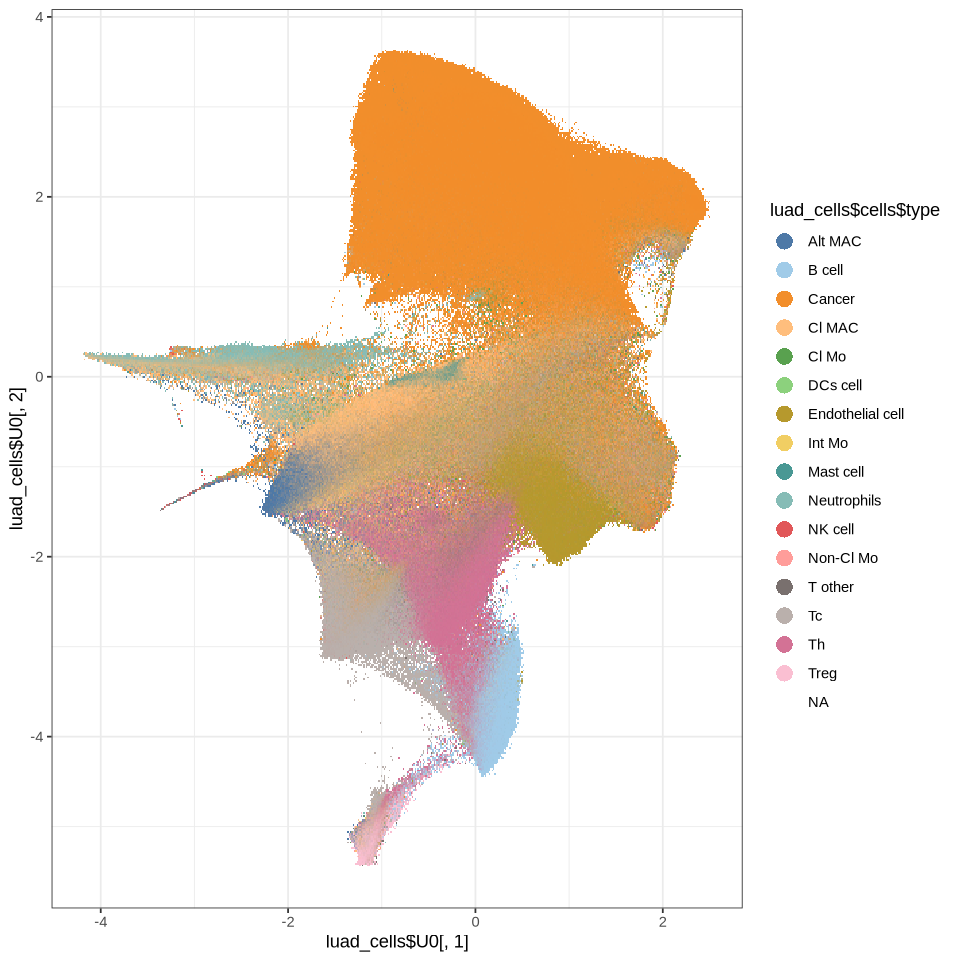

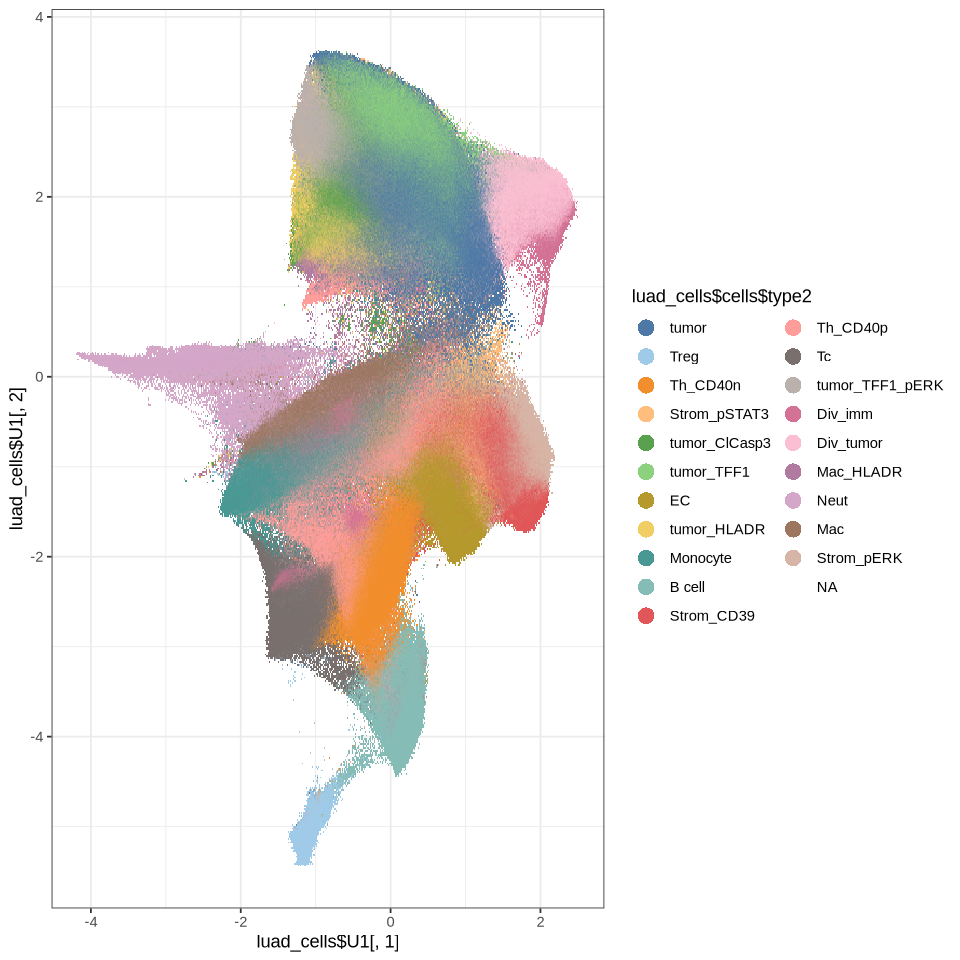

In [10]:
#celltype is original label from Sorin et al. celltype2 is our label from de novo clustering
fig.size(8,8)
ggplot() + 
    geom_scattermore(aes(luad_cells$U0[,1], luad_cells$U0[,2], col = luad_cells$cells$type), shape = ".")+
    scale_color_tableau(palette= "Tableau 20") +
    theme_bw() +
    guides(color = guide_legend(override.aes = list(stroke = 1, alpha = 1, shape = 16, size = 4)), alpha = "none")
    #facet_wrap(~SampleID)

ggplot() + 
    geom_scattermore(aes(luad_cells$U1[,1], luad_cells$U1[,2], col = luad_cells$cells$type2), shape = ".")+
    scale_color_tableau(palette= "Tableau 20") +
    theme_bw() +
    guides(color = guide_legend(override.aes = list(stroke = 1, alpha = 1, shape = 16, size = 4)), alpha = "none")

## Harmonized UMAP visualization

In [20]:
#recalculate umap for harmonized pcs
U1 = uwot::umap(luad_cells$H, min_dist = .05, spread = .3, fast_sgd = TRUE, n_threads = 16, ret_extra = 'fgraph')
#U1 <- saveRDS("full_panel_luad_humap.rds")

Found more than one class "dist" in cache; using the first, from namespace 'BiocGenerics'

Also defined by ‘spam’

Found more than one class "dist" in cache; using the first, from namespace 'BiocGenerics'

Also defined by ‘spam’



In [11]:
U1 <- readRDS("full_panel_luad_humap.rds")
luad_cells$U1 <- U1$embedding

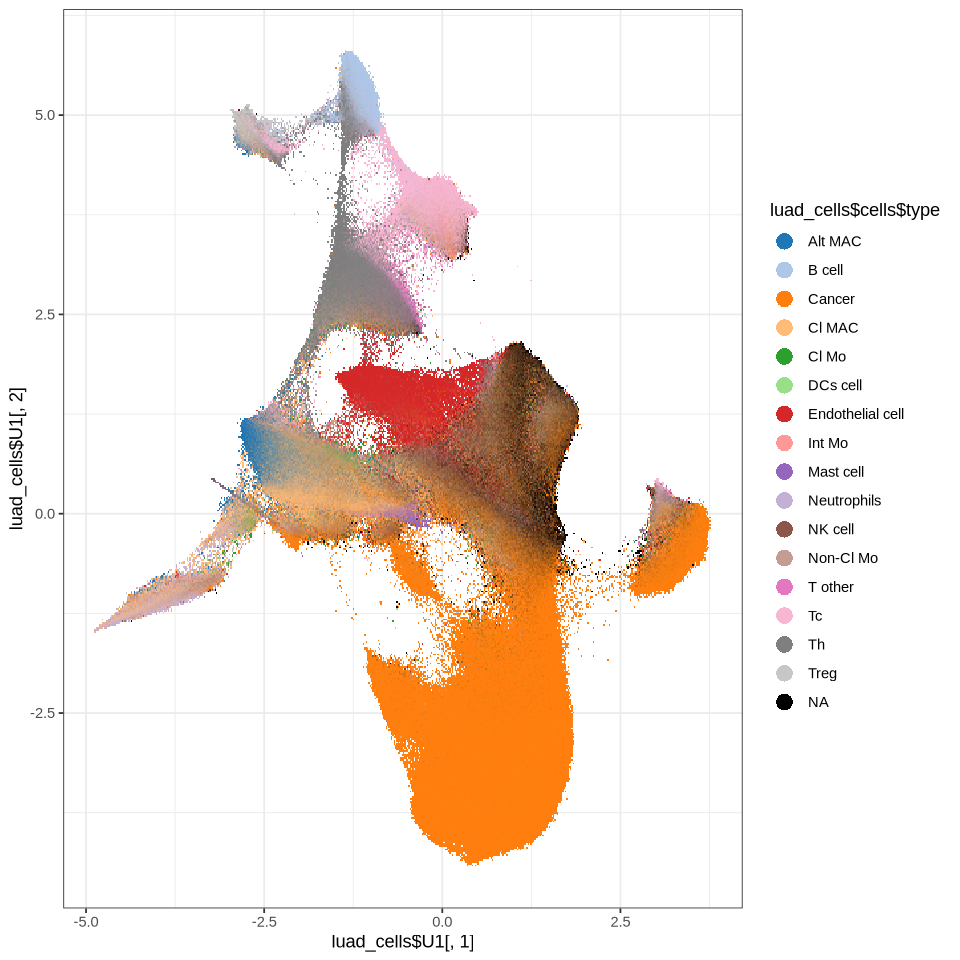

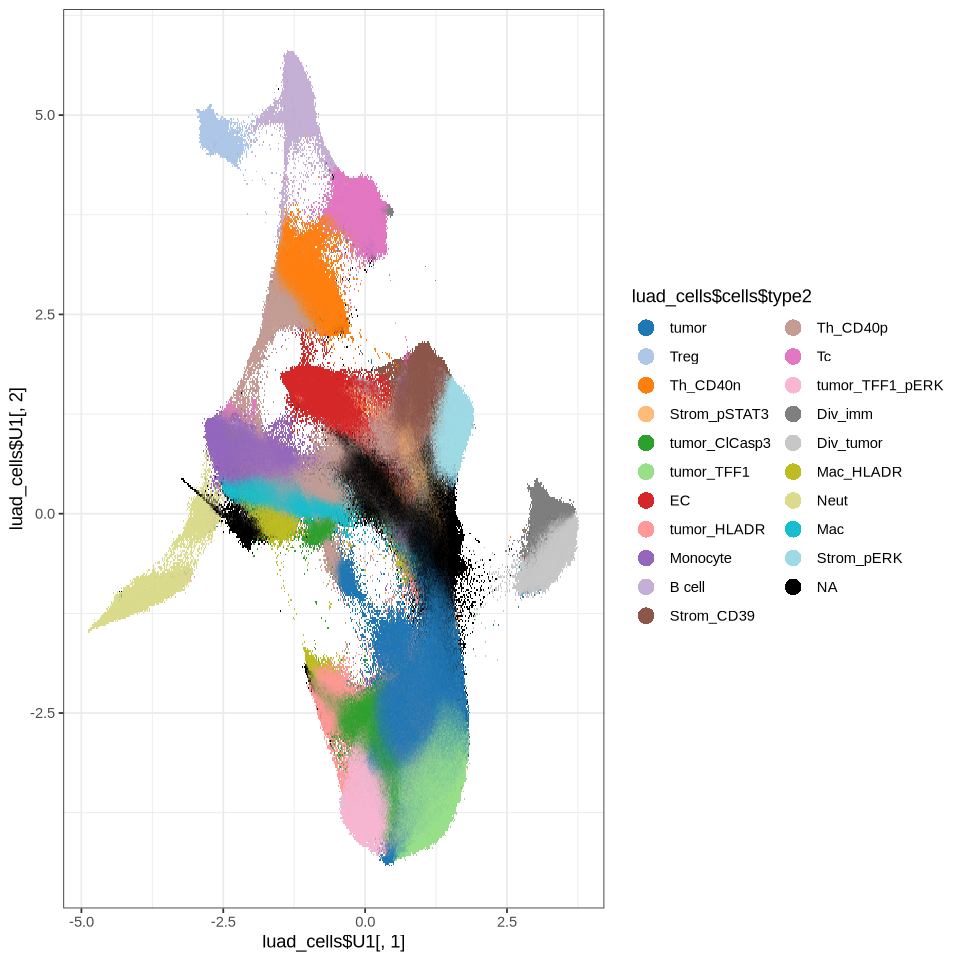

In [12]:
# visualize cell type labels in harmonized umap space

fig.size(8,8)

ggplot() + 
    geom_scattermore(aes(luad_cells$U1[,1], luad_cells$U1[,2], col = luad_cells$cells$type), shape = ".")+
    #scale_color_tableau(palette= "Tableau 20") +
    theme_bw() + 
    guides(color = guide_legend(override.aes = list(stroke = 1, alpha = 1, shape = 16, size = 4)), alpha = "none") + scale_color_tableau('Classic 20', na.value = 'black')
 #+
    #facet_wrap(~SampleID)

ggplot() + 
    geom_scattermore(aes(luad_cells$U1[,1], luad_cells$U1[,2], col = luad_cells$cells$type2), shape = ".")+
    #scale_color_tableau(palette= "Tableau 20") +
    theme_bw() +
    guides(color = guide_legend(override.aes = list(stroke = 1, alpha = 1, shape = 16, size = 4)), alpha = "none") + scale_color_tableau('Classic 20', na.value = 'black')


## Samples in space

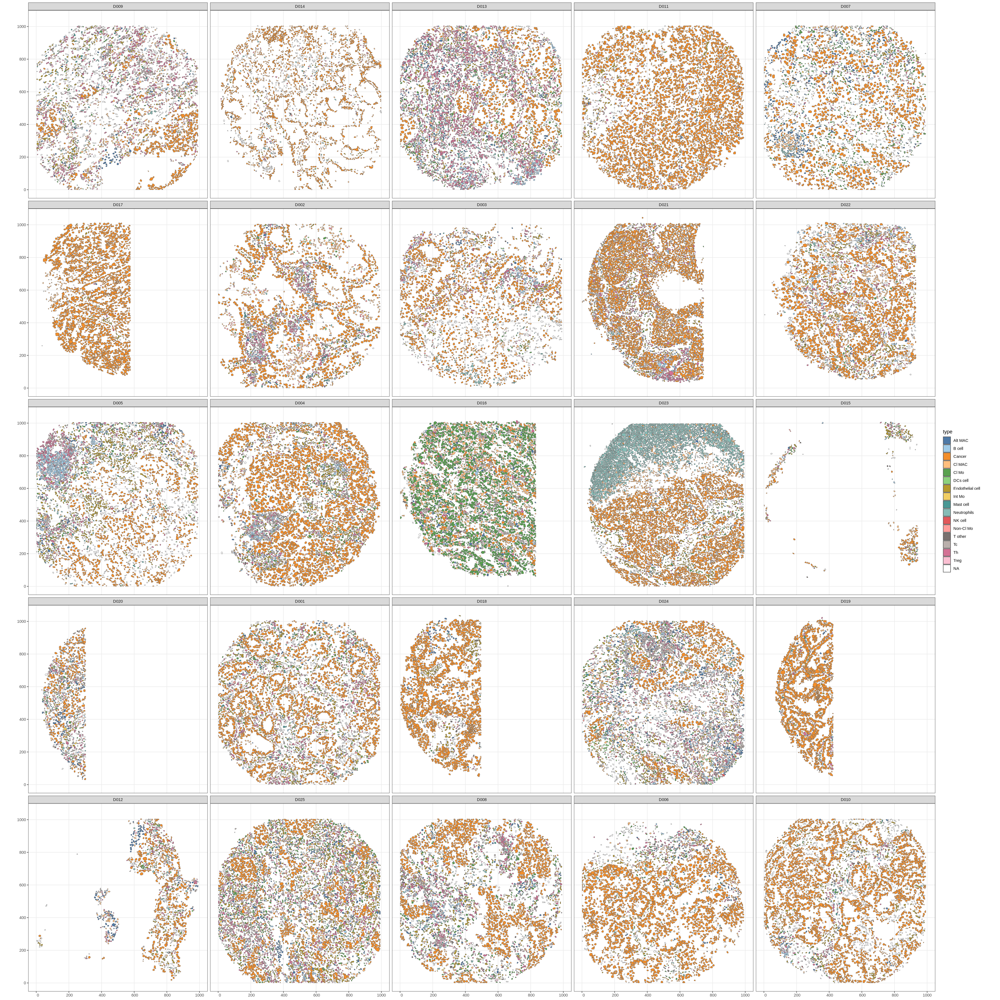

In [36]:
# Cell types in space. Several samples have large regions of low quality (NA) cells
fig.size(30,30)
ggplot(luad_cells$cells %>% filter(SampleID%in%unique(luad_cells$cells$SampleID)[1:25])) + 
    geom_sf(aes(geometry =shape, fill = type))+
    scale_fill_tableau(palette= "Tableau 20") +
    theme_bw() +
    facet_wrap(~SampleID)


In [13]:
# Extract cell centroids from cell shapes
luad_cells$cells$centroid <- luad_cells$cells$shape %>%
    sf::st_centroid()

centroid_xy <- do.call(rbind, st_geometry(luad_cells$cells$centroid)) %>% 
    as_tibble() %>% setNames(c("X","Y"))

luad_cells$cells$X <- centroid_xy$X
luad_cells$cells$Y <- centroid_xy$Y

Warning message:
“The `x` argument of `as_tibble.matrix()` must have unique column names if
`.name_repair` is omitted as of tibble 2.0.0.
ℹ Using compatibility `.name_repair`.”


## Sample level QC filtering

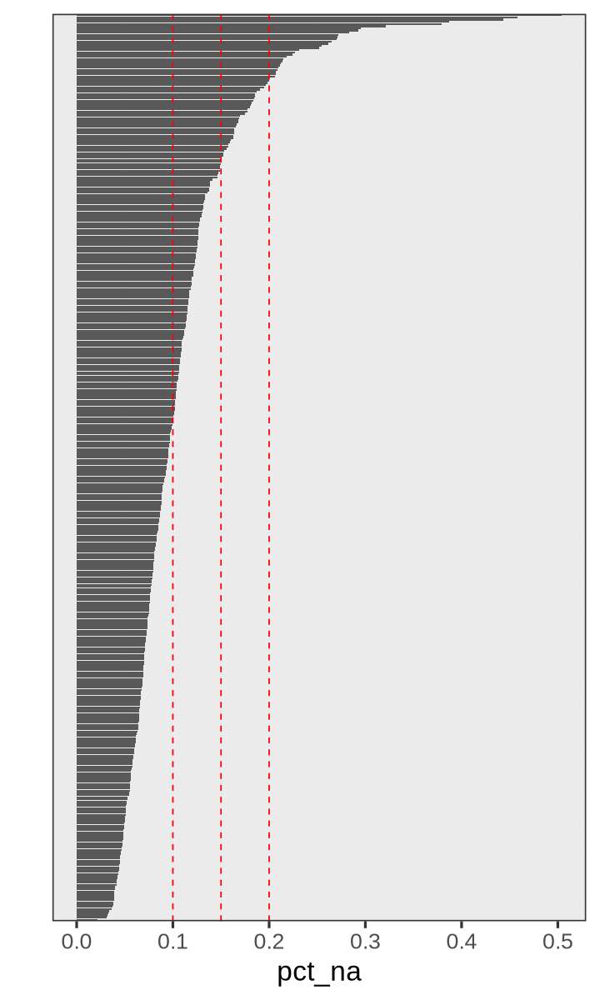

In [14]:
# We can identify low quality samples my filtering based on percentage of "NA" cells. 
df = luad_cells$cells %>% 
    with(table(SampleID, is.na(type2))) %>% 
    prop.table(1) %>% 
    data.table() %>% 
    filter(V1 == 'TRUE') %>% dplyr::select(-V1) %>% 
    dplyr::rename(pct_na=N)


fig.size(10, 6)
ggplot(df, aes(reorder(SampleID, pct_na), pct_na)) + 
    coord_flip() + 
    geom_bar(stat = 'identity') + 
    geom_hline(yintercept = c(.1, .15, .2), linetype = 2, color = 'red') + 
    theme_bw(base_size = 20) + 
    theme(axis.text.y = element_blank(), axis.ticks.y = element_blank()) + 
    labs(x = '') + 
    NULL

In [15]:
samples_keep <- df %>%filter(pct_na < 0.2) %>% select(SampleID) %>% as.vector
samples_rm <- df %>%filter(pct_na >= 0.2) %>% select(SampleID) %>% as.vector
head(samples_keep)
length(samples_keep$SampleID)
length(unique(luad_cells$cells$SampleID))
# lets set the cutoff at samples with less than 20% na cells
# ~7% of samples qcd out

$SampleID
  [1] "D050" "D180" "D009" "D341" "D134" "D044" "D131" "D364" "D074" "D247"
 [11] "D123" "D275" "D396" "D208" "D028" "D310" "D035" "D406" "D279" "D269"
 [21] "D040" "D076" "D379" "D045" "D359" "D130" "D371" "D324" "D155" "D133"
 [31] "D410" "D263" "D063" "D215" "D159" "D339" "D287" "D284" "D330" "D384"
 [41] "D105" "D181" "D362" "D365" "D360" "D259" "D106" "D228" "D057" "D282"
 [51] "D230" "D042" "D311" "D267" "D375" "D041" "D374" "D342" "D014" "D336"
 [61] "D102" "D337" "D394" "D403" "D383" "D265" "D153" "D013" "D402" "D070"
 [71] "D314" "D011" "D256" "D380" "D392" "D047" "D319" "D290" "D121" "D232"
 [81] "D291" "D117" "D144" "D349" "D166" "D202" "D150" "D162" "D143" "D316"
 [91] "D253" "D191" "D109" "D389" "D056" "D218" "D170" "D030" "D393" "D214"
[101] "D227" "D007" "D299" "D188" "D066" "D091" "D296" "D407" "D309" "D060"
[111] "D243" "D085" "D192" "D235" "D305" "D378" "D207" "D154" "D114" "D274"
[121] "D217" "D241" "D126" "D320" "D149" "D345" "D132" "D033" "D321" "D415"
[131] "D315" "D414" "D146" "D326" "D120" "D294" "D400" "D281" "D152" "D002"
[141] "D182" "D145" "D356" "D151" "D116" "D338" "D071" "D003" "D095" "D270"
[151] "D055" "D273" "D081" "D115" "D260" "D333" "D148" "D177" "D373" "D195"
[161] "D307" "D103" "D080" "D029" "D135" "D390" "D242" "D027" "D401" "D175"
[171] "D100" "D021" "D409" "D172" "D026" "D107" "D295" "D370" "D160" "D094"
[181] "D078" "D164" "D097" "D292" "D068" "D104" "D049" "D236" "D258" "D037"
[191] "D347" "D189" "D222" "D361" "D289" "D179" "D229" "D285" "D067" "D288"
[201] "D306" "D411" "D252" "D317" "D043" "D416" "D096" "D005" "D322" "D147"
[211] "D004" "D268" "D072" "D412" "D210" "D391" "D343" "D110" "D016" "D225"
[221] "D193" "D136" "D023" "D196" "D246" "D250" "D184" "D062" "D261" "D312"
[231] "D031" "D257" "D165" "D220" "D093" "D404" "D206" "D201" "D038" "D061"
[241] "D221" "D079" "D089" "D156" "D219" "D357" "D052" "D344" "D158" "D046"
[251] "D245" "D376" "D020" "D278" "D141" "D142" "D323" "D262" "D001" "D211"
[261] "D334" "D039" "D090" "D350" "D185" "D122" "D231" "D255" "D212" "D108"
[271] "D018" "D277" "D203" "D024" "D019" "D088" "D304" "D226" "D271" "D369"
[281] "D098" "D125" "D249" "D293" "D194" "D187" "D058" "D332" "D328" "D300"
[291] "D355" "D358" "D167" "D157" "D032" "D329" "D297" "D204" "D161" "D408"
[301] "D318" "D012" "D233" "D303" "D363" "D092" "D186" "D237" "D313" "D209"
[311] "D354" "D086" "D174" "D128" "D075" "D264" "D073" "D200" "D234" "D385"
[321] "D223" "D248" "D173" "D171" "D082" "D139" "D137" "D163" "D190" "D276"
[331] "D395" "D127" "D138" "D240" "D368" "D327" "D025" "D065" "D382" "D034"
[341] "D059" "D036" "D397" "D254" "D183" "D413" "D405" "D129" "D251" "D224"
[351] "D308" "D346" "D266" "D198" "D084" "D083" "D048" "D377" "D372" "D077"
[361] "D054" "D238" "D205" "D325" "D381" "D399" "D087" "D169" "D064" "D367"
[371] "D008" "D111" "D006" "D280" "D051" "D272" "D244" "D053" "D283" "D199"
[381] "D119" "D010" "D353" "D398" "D140"

[1] 385

[1] 414

Scale for colour is already present.
Adding another scale for colour, which will replace the existing scale.


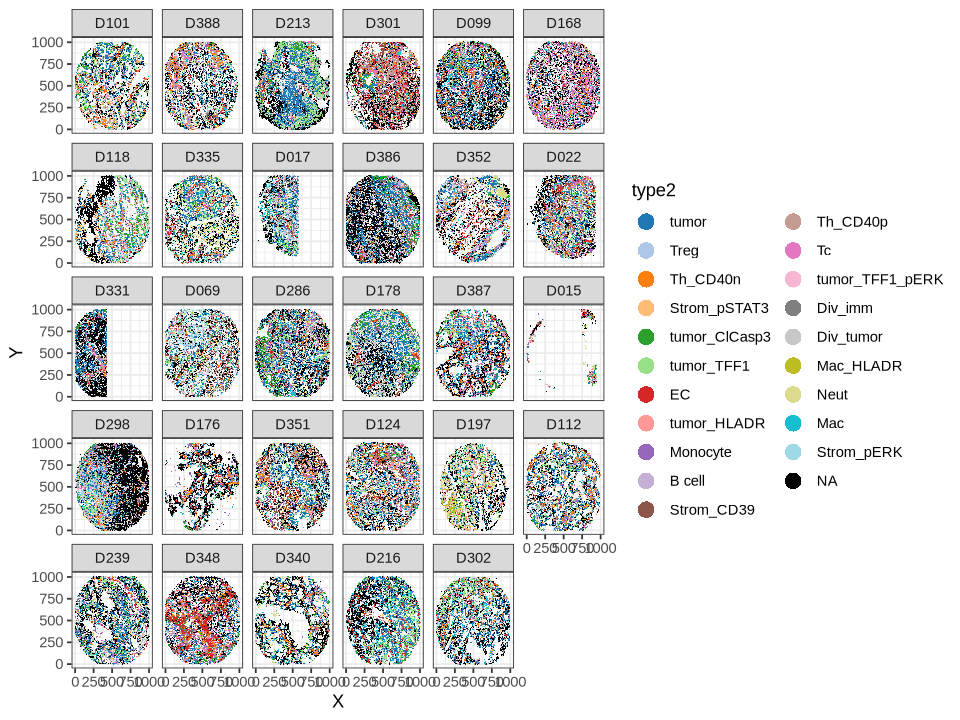

In [16]:
# visualization of bad samples
fig.size(6,8)
ggplot(luad_cells$cells %>% filter(SampleID%in%samples_rm$SampleID)) + 
    geom_point(aes(X,Y, col = type2), shape = ".") + 
    scale_color_tableau(palette= "Tableau 20") +
    theme_bw() +
    facet_wrap(~SampleID) + 
    guides(color = guide_legend(override.aes = list(stroke = 1, alpha = 1, shape = 16, size = 4)), alpha = "none") + scale_color_tableau('Classic 20', na.value = 'black')


In [17]:
cells_keep = which(luad_cells$cells$SampleID %in% samples_keep$SampleID)
length(cells_keep)
nrow(luad_cells$cells)
# ~ 7% of cells qcd out as well

[1] 1493455

[1] 1600095

In [18]:
luad_cells_clean <- list(cells=luad_cells$cells[cells_keep,],
                         X=luad_cells$X[, cells_keep], 
                         H=luad_cells$H[cells_keep,])#, U1=U1, udv=udv)# %>% saveRDS('cells_v4a_qcd.rds')

In [53]:
# recalculate umap post QC
U1_clean <- uwot::umap(luad_cells_clean$H, min_dist = .05, spread = .3, fast_sgd = TRUE, n_threads = 16, ret_extra = 'fgraph')

Found more than one class "dist" in cache; using the first, from namespace 'BiocGenerics'

Also defined by ‘spam’

Found more than one class "dist" in cache; using the first, from namespace 'BiocGenerics'

Also defined by ‘spam’



In [88]:
luad_cells_clean$U1 <- U1_clean$embedding

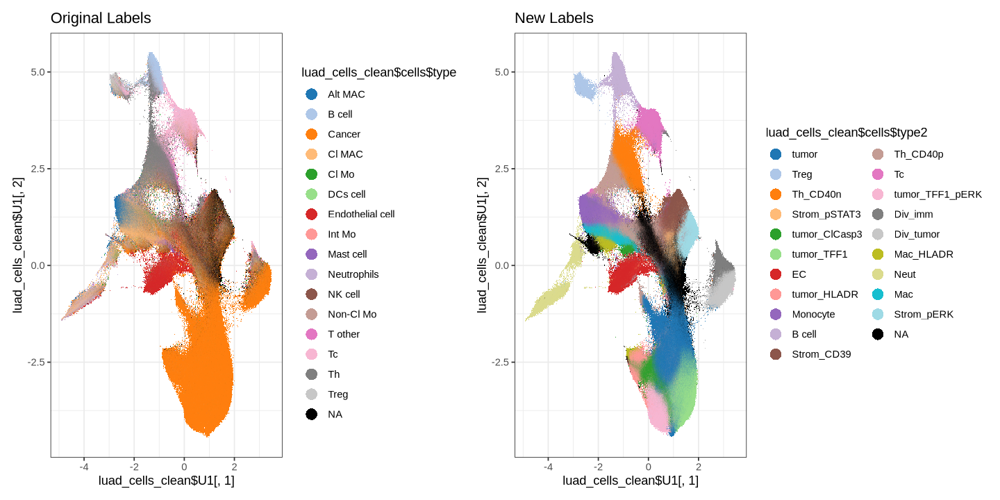

In [22]:
fig.size(6,12)
p1 <- ggplot() + 
    geom_scattermore(aes(luad_cells_clean$U1[,1], luad_cells_clean$U1[,2], col = luad_cells_clean$cells$type), shape = ".")+
    #scale_color_tableau(palette= "Tableau 20") +
    theme_bw() +
    guides(color = guide_legend(override.aes = list(stroke = 1, alpha = 1, shape = 16, size = 4)), alpha = "none") + scale_color_tableau('Classic 20', na.value = 'black')+
    ggtitle("Original Labels")
#no difference

p2 <- ggplot() + 
    geom_scattermore(aes(luad_cells_clean$U1[,1], luad_cells_clean$U1[,2], col = luad_cells_clean$cells$type2), shape = ".")+
    #scale_color_tableau(palette= "Tableau 20") +
    theme_bw() +
    guides(color = guide_legend(override.aes = list(stroke = 1, alpha = 1, shape = 16, size = 4)), alpha = "none") + scale_color_tableau('Classic 20', na.value = 'black')+
    ggtitle("New Labels")

p1|p2

In [93]:
saveRDS(luad_cells_clean, 'cells_v4a_qcd.rds')

## Identify cell type markers

In [54]:
i = split(seq_len(nrow(luad_cells$cells)), luad_cells$cells$type2) %>% purrr::map(sample, size = 1200) %>% unlist() %>% as.integer

# options(future.globals.maxSize= 1e12)
# plan(multicore)
plts = purrr::map(rownames(luad_cells$X), function(g) {
    .df = luad_cells$cells[i, ] %>% 
        cbind(U1$embedding[i, ]) %>% 
        cbind(VALUE = luad_cells$X[g, i]) %>% 
        # arrange(VALUE) %>% 
        dplyr::sample_frac(1L) %>% 
        identity()
    .df$VALUE = pmin(.df$VALUE, quantile(.df$VALUE, .99))
    ggplot(.df, aes(V1, V2, color = VALUE)) + 
        # geom_scattermost() + 
        # geom_scattermore(shape = '.') + 
        # theme_bw(base_size = 16) + 
        geom_point(size = .5) + 
        scale_color_gradient2(mid = 'lightgrey') + 
        labs(title = g) + 
        guides(color = 'none') + 
        theme_void() + 
        NULL  
})

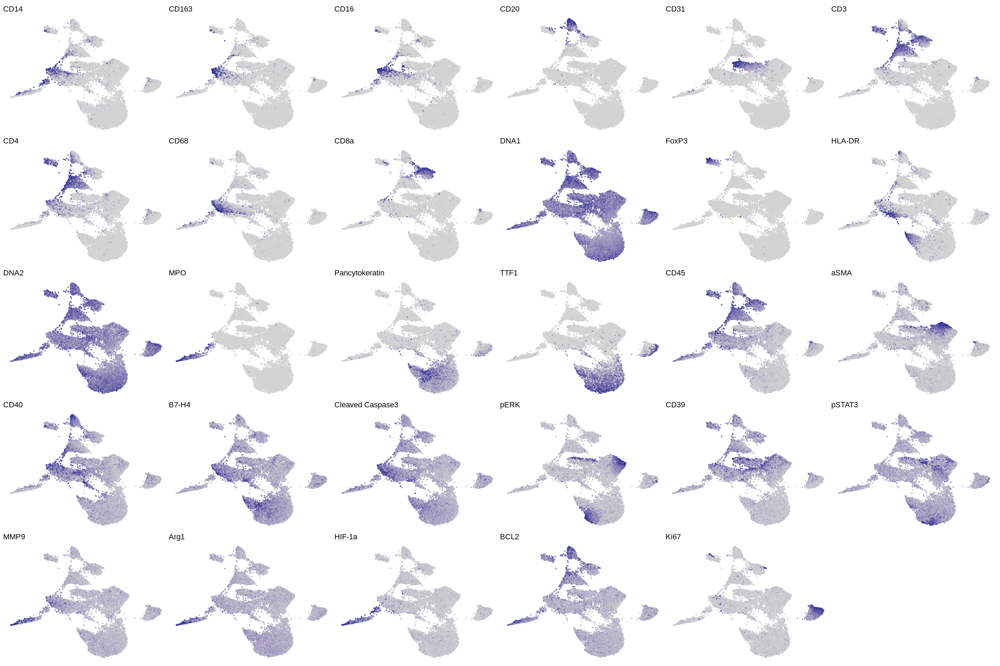

In [55]:
fig.size(16, 24)
Reduce(`+`, plts)

In [48]:
M <- wilcoxauc(luad_cells_clean$X, as.character(luad_cells_clean$cells$type2))

Removing NA values from labels




Attaching package: ‘scales’


The following object is masked from ‘package:viridis’:

    viridis_pal


The following object is masked from ‘package:purrr’:

    discard




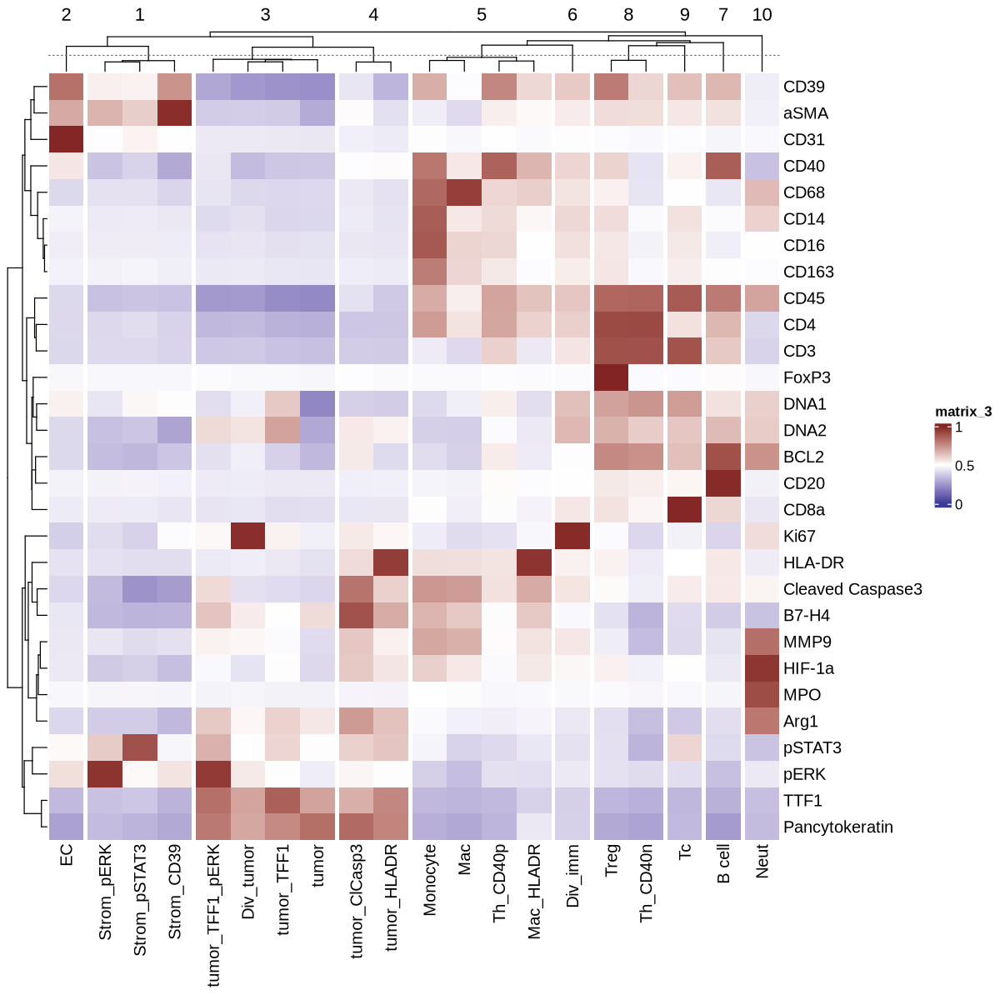

In [52]:
M <- unique(M)
fig.size(10, 10)
mat = dcast(data.table(M), feature ~ group, value.var = 'auc') %>% 
    tibble::column_to_rownames('feature') %>% 
    as.matrix() 

Heatmap(mat, col = colorRamp2(c(0, .5, 1), c(muted('blue'), 'white', muted('red'))), column_km = 10)